Alumnos: Javier Orti García, José Delgado Jiménez

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
# from google.colab.patches import cv2_imshow
from PIL import Image
from scipy.stats import trim_mean

Ecualización básica

In [4]:
img = Image.open('./img/1/1.jpg').convert('L')
img_array = np.array(img)
height, width = img_array.shape
flat_array = img_array.flatten()

# 1. Histograma
hist, bins = np.histogram(flat_array, 256, [0,256])

# 2. Función de probabilidad (PMF)
pmf = hist / hist.sum()

# 3. Histograma acumulativ
cdf = pmf.cumsum()
cdf_normalized = cdf * (hist.max() / cdf.max())

# 4. Ecualización del histograma acumulativo
L = 256
T = np.round((L - 1) * cdf).astype(np.uint8)

# 5. Formación de la nueva imagen
image_eq_flat = T[flat_array]

# Restaurar las dimensiones de la imagen
image_eq = image_eq_flat.reshape(height, width)

## **1 y 2: CLAHE**

Para ello mostramos una comparacion entre el algoritmo que nos da la libreria cv2 respecto a nuestra propia implementación.

Con CV2:

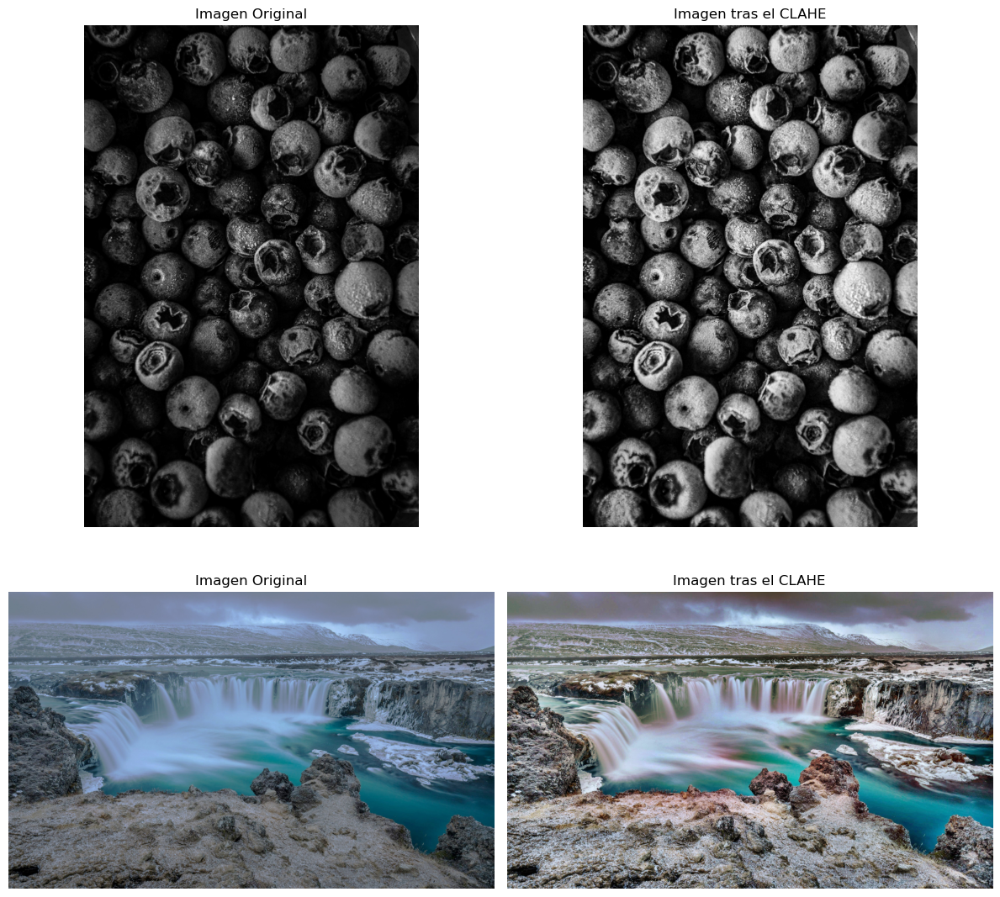

In [5]:
# CLAHE a la imagen en blanco y negro
image_l = cv2.imread('./img/1/1.jpg', cv2.IMREAD_GRAYSCALE)
clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8, 8))
clahe_img_l = clahe.apply(image_l)

# CLAHE a la imagen a color, aplicándolo a cada color
image_rgb = cv2.imread('./img/2/2.jpg')
image_rgb = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2RGB)
channels = cv2.split(image_rgb)
clahe_img_rgb = []
for channel in channels:
    clahe_img_rgb.append(clahe.apply(channel))

# Recompone los canales después de aplicar CLAHE
clahe_img_rgb = cv2.merge(clahe_img_rgb)

# Muestra los resultados comparativamente
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

ax[0, 0].imshow(image_l, cmap='gray')
ax[0, 0].set_title('Imagen Original')
ax[0, 0].axis('off')

ax[0, 1].imshow(clahe_img_l, cmap='gray')
ax[0, 1].set_title('Imagen tras el CLAHE')
ax[0, 1].axis('off')

ax[1, 0].imshow(image_rgb)
ax[1, 0].set_title('Imagen Original')
ax[1, 0].axis('off')

ax[1, 1].imshow(clahe_img_rgb)
ax[1, 1].set_title('Imagen tras el CLAHE')
ax[1, 1].axis('off')

plt.tight_layout()
plt.show()


Algoritmo propio:

In [15]:
def clahe_eq_histogram(hist, clip_limit, nbins=256):
    """
    Aplica el clipping al histograma y genera la matriz de transformación (LUT) para CLAHE.
    - hist: histograma de la subregión
    - clip_limit: valor máximo permitido para cada bin
    - nbins: número de bins (normalmente 256)
    -> return: matriz de transformación.
    """
    # Convertir clip_limit a entero
    clip_limit = int(clip_limit)

    # Clipping del histograma
    hist_clipped = hist.copy()
    excess = hist_clipped - clip_limit
    excess[excess < 0] = 0
    total_excess = np.sum(excess)
    hist_clipped[hist_clipped > clip_limit] = clip_limit

    # Convertir hist_clipped a entero si no lo es
    hist_clipped = hist_clipped.astype(np.int32)

    # Redistribución del exceso
    redistribute = int(total_excess // nbins)
    remainder = int(total_excess % nbins)

    hist_clipped += redistribute

    if remainder > 0:
        # Para evitar el error, también aseguramos que el slicing es correcto
        hist_clipped[:remainder] += 1

    # Calcular la CDF
    cdf = hist_clipped.cumsum()
    cdf_normalized = (cdf * (nbins - 1) / cdf[-1]).astype(np.uint8)

    return cdf_normalized

def clahe_channel(channel, limit, grid_size):
    h, w = channel.shape
    num_tiles_y, num_tiles_x = grid_size
    tile_height = h // num_tiles_y
    tile_width = w // num_tiles_x
    output = np.zeros_like(channel)
    nbins = 256
    for i in range(num_tiles_y):
        for j in range(num_tiles_x):
            y = i * tile_height
            x = j * tile_width
            y1 = y + tile_height if i < num_tiles_y - 1 else h
            x1 = x + tile_width if j < num_tiles_x - 1 else w
            subregion = channel[y:y1, x:x1]
            hist = np.histogram(subregion, bins=nbins, range=(0, nbins))[0]
            n_pixels = subregion.size
            clip_limit_value = limit * n_pixels / nbins
            clip_limit_value = int(clip_limit_value)
            lut = clahe_eq_histogram(hist, clip_limit_value, nbins=nbins)
            subregion_flat = subregion.flatten()
            equalized_subregion_flat = lut[subregion_flat]
            equalized_subregion = equalized_subregion_flat.reshape(subregion.shape)
            output[y:y1, x:x1] = equalized_subregion
    return output

def clahe(image, limit=2.0, grid_size=(8, 8)):
    """
    Aplica el algoritmo CLAHE a una imagen.
    - image: numpy array de la imagen (grayscale o RGB).
    - limit: clip limit (valor mayor aumenta el contraste, por defecto 2.0).
    - grid_size: número de tiles en las dimensiones (y, x).
    -> return: imagen transformada como numpy array.
    """
    if image.ndim == 2:
        # Imagen en escala de grises
        processed_image = clahe_channel(image, limit, grid_size)
    elif image.ndim == 3 and image.shape[2] == 3:
        # Imagen a color
        channels = cv2.split(image)
        processed_channels = []
        for channel in channels:
            processed_channel = clahe_channel(channel, limit, grid_size)
            processed_channels.append(processed_channel)
        processed_image = cv2.merge(processed_channels)
    else:
        raise ValueError("La imagen debe ser en escala de grises o RGB con 3 canales.")
    return processed_image

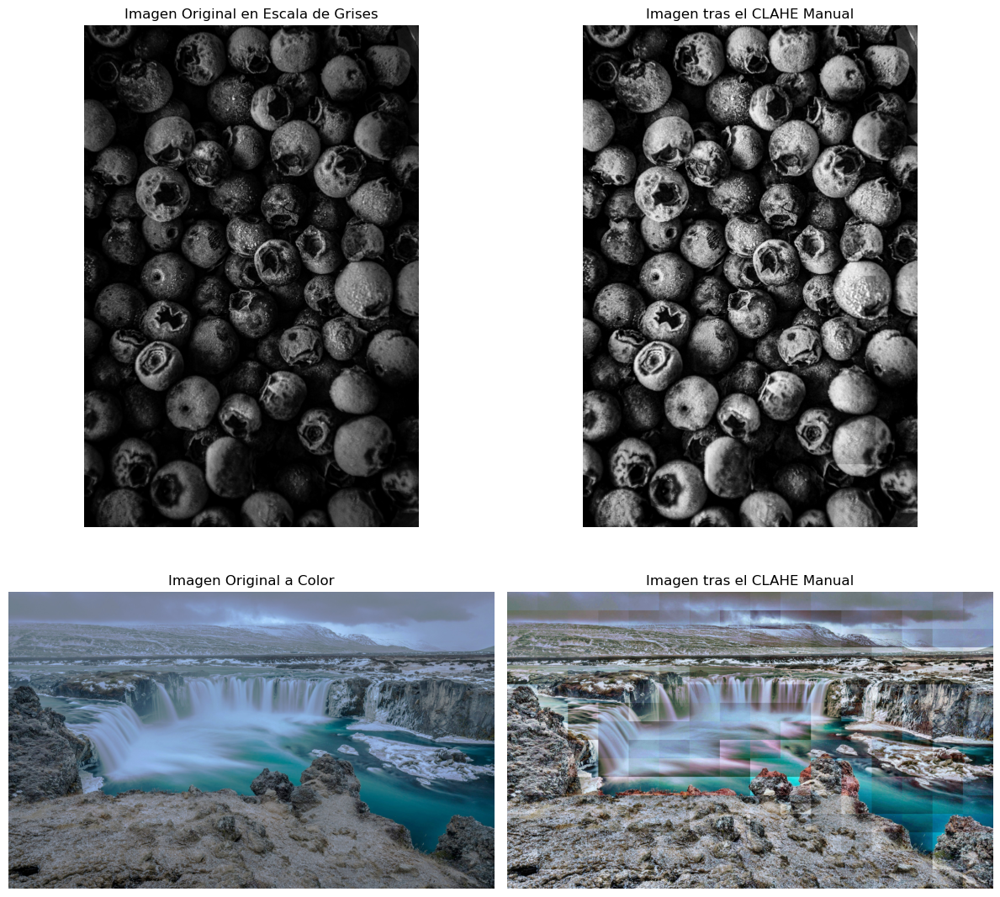

In [30]:
# Cargar las imágenes
# Imagen en escala de grises
image_l = cv2.imread('./img/1/1.jpg', cv2.IMREAD_GRAYSCALE)

# Imagen a color
image_rgb = cv2.imread('./img/2/2.jpg')

# Aplicar CLAHE manual
clahe_img_l = clahe(image_l, limit=2.0, grid_size=(8, 8))
clahe_img_rgb = clahe(image_rgb, limit=2.0, grid_size=(16, 16))

# Convertir imágenes a RGB para mostrar con Matplotlib
image_rgb_display = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2RGB)
clahe_img_rgb_display = cv2.cvtColor(clahe_img_rgb, cv2.COLOR_BGR2RGB)

# Mostrar los resultados
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

ax[0, 0].imshow(image_l, cmap='gray')
ax[0, 0].set_title('Imagen Original en Escala de Grises')
ax[0, 0].axis('off')

ax[0, 1].imshow(clahe_img_l, cmap='gray')
ax[0, 1].set_title('Imagen tras el CLAHE Manual')
ax[0, 1].axis('off')

ax[1, 0].imshow(image_rgb_display)
ax[1, 0].set_title('Imagen Original a Color')
ax[1, 0].axis('off')

ax[1, 1].imshow(clahe_img_rgb_display)
ax[1, 1].set_title('Imagen tras el CLAHE Manual')
ax[1, 1].axis('off')

plt.tight_layout()
plt.show()

# **3 y 4: ELIMINACIÓN DE RUIDO**

Para la 3 tenemos una hoja sobre un fondo blanco con un moderado o medio fuerte ruido gausiano

Tras probar varios filtros y ajustar los parámetros, hemos obtado por aplicar un filtro bilateral. Como tenemos ante nosotros una imagen con mucho ruido, obtamos por tomar valores de sigma bastante altos (tal y como se menciona en [la documentacion de OpenCV](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga9d7064d478c95d60003cf839430737ed), se considera alto por encima de 150). También, como no necesitamos que la ejecucción sea en tiempo real ni tenemos restricciones temporales, hemos elegido un diametro de vecindario alto para mejorar la calidad del filtro.
Por último, cabe mencionar que al ser un único objeto centrado sobre un fondo blanco, nos interesa que SigmaSpace > SigmaColor.

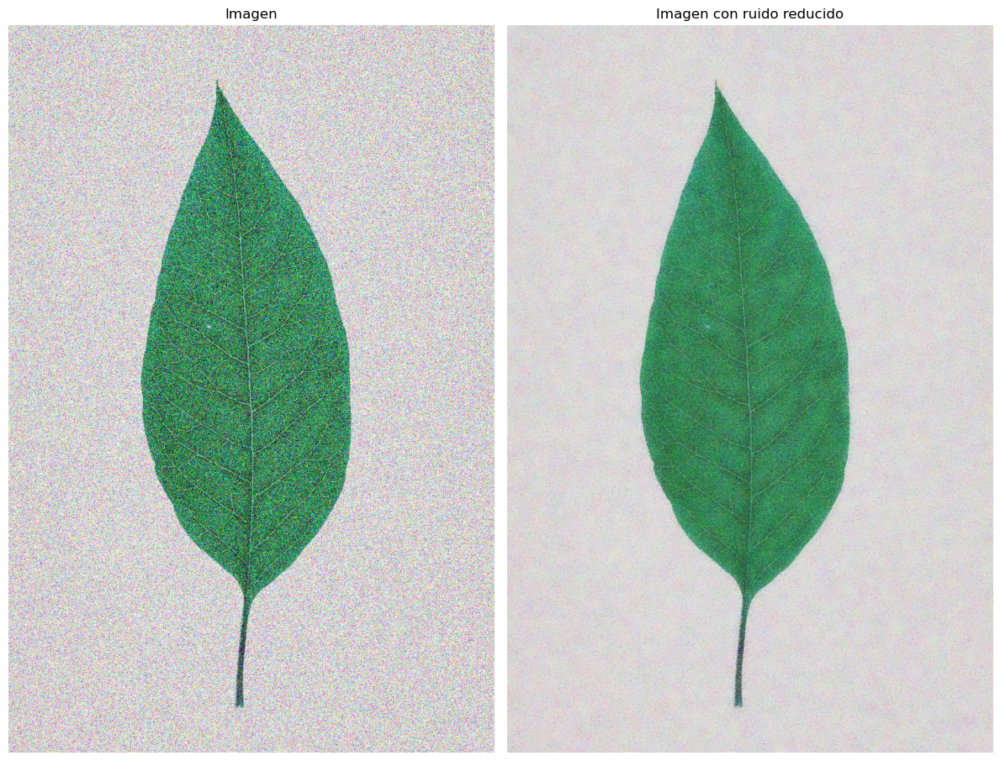

In [17]:
image_path = './img/3/3.png'

image = cv2.imread(image_path)

# Aplica el filtro bilateral
# d: diámetro de cada vecindario de píxeles
# sigmaColor: desviación estándar en el espacio de color (mayor valor significa que se mezclan más colores)
# sigmaSpace: desviación estándar en el espacio de coordenadas (mayor valor significa que se mezclan píxeles más lejanos)
filtered_image = cv2.bilateralFilter(image, d=31, sigmaColor=125, sigmaSpace=200)

# Muestra los resultados comparativamente
fig, ax = plt.subplots(1, 2, figsize=(12, 12))

ax[0].imshow(image)
ax[0].set_title('Imagen')
ax[0].axis('off')

ax[1].imshow(filtered_image)
ax[1].set_title('Imagen con ruido reducido')
ax[1].axis('off')

plt.tight_layout()
plt.show()

3) Aunque no está dentro del temario, creo que es muy interesante mencionar el fastNlMeansDenoisingColored, que viene a ser un filtro que se basa en buscar patrones similares en la globalidad de la imagen y aplicar un promedio ponderado de los valores de los píxeles en estas regiones similares (al contrario que los filtros de la mediana o media que buscan en la vecindad).   

Tal y como recomienda la documentación de OpenCV, hemos utilizado un search window y un block size estándar. Para h_luminance (la intensidad de brillo) sin embargo hemos obtado por un valor mayor del recomendado. Pero sin duda, el parámetro que más influye para esta imagen es el de photo_render, que funciona parecido al h_luminance pero para cada canal de color y puesto que la imagen debería ser mayoritariamente verde, pero el ruido la ha alterado aplicando colores que no existían originalmente, hemos elegido un valor muy alto para este parámetro.


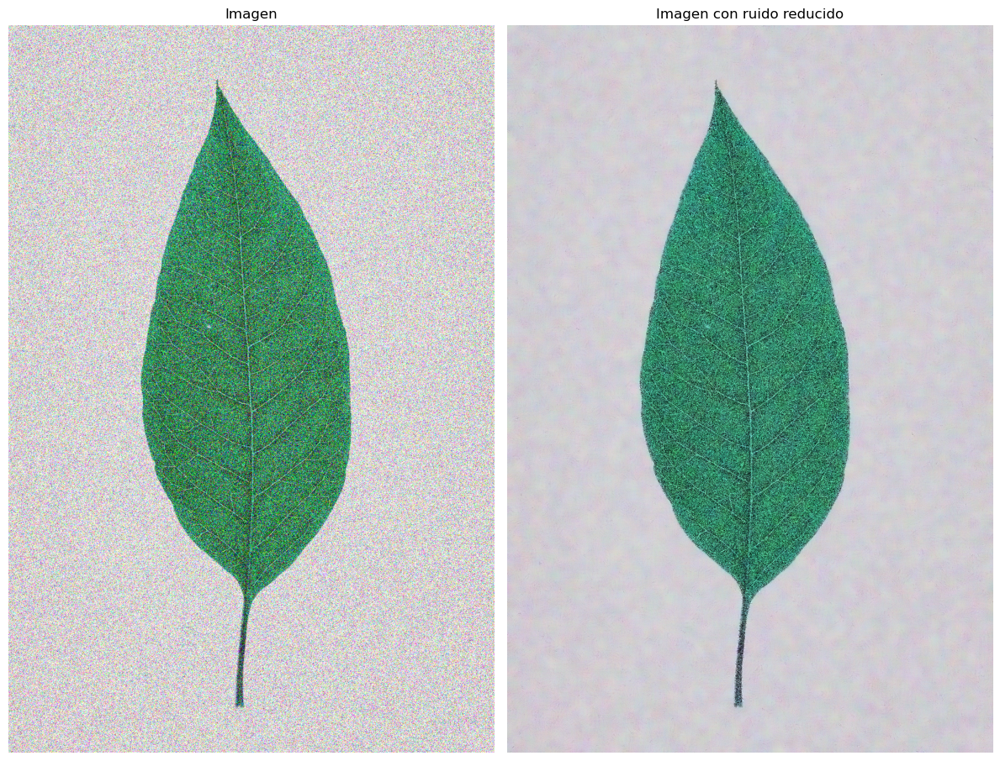

In [18]:
image_path = './img/3/3.png'

imagen = cv2.imread(image_path)

h_luminance = 18
photo_render =  29
search_window =  7
block_size = 21
filtered_image = cv2.fastNlMeansDenoisingColored(imagen, None, h_luminance, photo_render, search_window, block_size)

# Muestra los resultados comparativamente
fig, ax = plt.subplots(1, 2, figsize=(12, 12))

ax[0].imshow(imagen)
ax[0].set_title('Imagen')
ax[0].axis('off')

ax[1].imshow(filtered_image)
ax[1].set_title('Imagen con ruido reducido')
ax[1].axis('off')

plt.tight_layout()
plt.show()

Para la 4 tenemos una imagen en blanco y negro de una radiografia con un ruido del tipo Salt n Pepper bastante agudo.

Por suerte, este tipo de problema en imagenes en blanco y negro tienen una muy buena solución, que es el filtro de la mediana. Tras probar tamaños de kernel impares, hemos observado que obtenemos un resultado satisfactorio para un ksize de 11x11, en el que las regiones de interes han aumentado el contraste y se ha eliminado el ruido por completo.

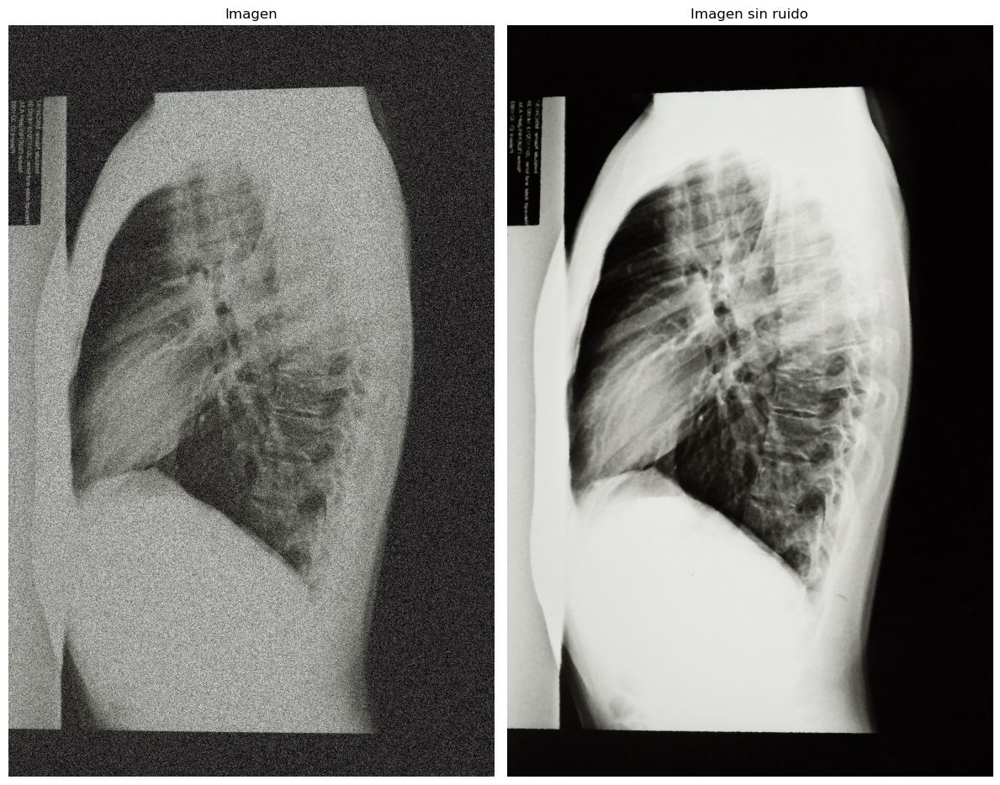

In [23]:
image_path = './img/3/4.jpg'

image = cv2.imread(image_path)

filtered_image = cv2.medianBlur(image, 11)

# Muestra los resultados comparativamente
fig, ax = plt.subplots(1, 2, figsize=(12, 12))

ax[0].imshow(image, cmap='gray')
ax[0].set_title('Imagen')
ax[0].axis('off')

ax[1].imshow(filtered_image, cmap='gray')
ax[1].set_title('Imagen sin ruido')
ax[1].axis('off')

plt.tight_layout()
plt.show()

# **5: Filtro Gausiano**

Vamos a aplicar primero el filtro gausiano con cv2 en la imagen para tener una referencia. Le hemos aplicado un sigma y un kernel exagerados para obtener alguna diferencia, ya que la imagen al no tener ruido con unos parámetros estándar no sufría ningún cambio.

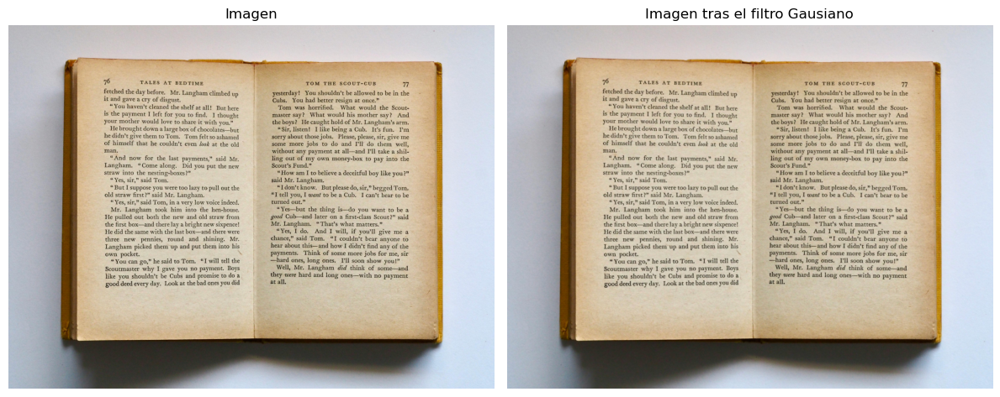

In [25]:
image_path = './img/5/5.jpg'

image = cv2.imread(image_path)

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

filtered_image = cv2.GaussianBlur(image, (5, 5), 233)

# Muestra los resultados comparativamente
fig, ax = plt.subplots(1, 2, figsize=(12, 12))

ax[0].imshow(image)
ax[0].set_title('Imagen')
ax[0].axis('off')

ax[1].imshow(filtered_image)
ax[1].set_title('Imagen tras el filtro Gausiano')
ax[1].axis('off')

plt.tight_layout()
plt.show()

Algoritmo propio:

Podemos observar que al probar el algoritmo propio en la imagen 5, al igual que para la implementación de cv2, no cambia en nada ni usando un sigma exagerado.   
Si probamos con la imagen 3, que tiene más ruido, vemos que se aplica correctamente la transformación.

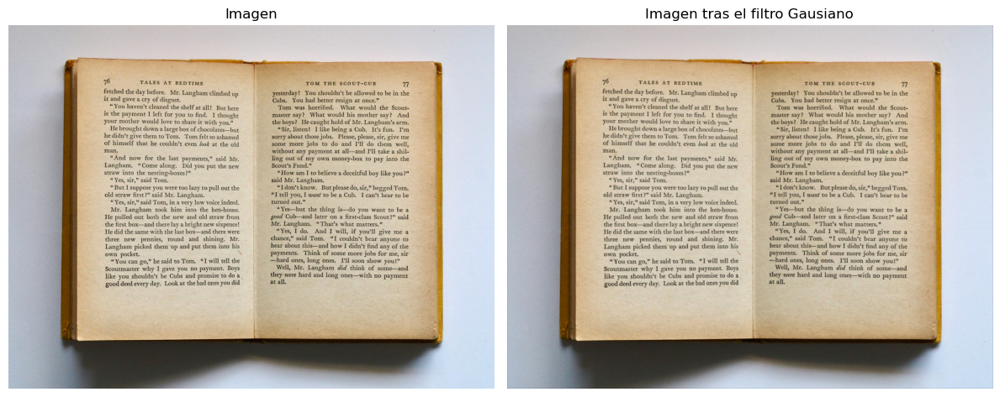

In [26]:
def gaussian_kernel(size=5, sigma=1):
    """
    Genera un kernel gaussiano 2D.
    - size: tamaño del kernel (debe ser impar)
    - sigma: desviación estándar de la distribución gaussiana.
    -> return: matriz 2D.
    """
    kernel = np.fromfunction(lambda x, y: (1/ (2 * np.pi * sigma ** 2)) *
                             np.exp(-((x - (size - 1) / 2) ** 2 +
                                      (y - (size - 1) / 2) ** 2) / (2 * sigma ** 2)),
                             (size, size))
    return kernel / np.sum(kernel)


def apply_gaussian_filter(image, kernel):
    """
    Aplica un filtro gaussiano a una imagen.
    - image: imagen en formato de matriz numpy (RGB).
    - kernel: kernel gaussiano generado con la funcion gaussian_kernel.
    -> return: imagen filtrada.
    """
    image = np.array(image)

    img_height, img_width, num_channels = image.shape
    kernel_size = kernel.shape[0]
    pad = kernel_size // 2

    # Aplica un padding para mantener el tamaño original de la imagen
    padded_image = np.pad(image, ((pad, pad), (pad, pad), (0, 0)), mode='constant')

    # Inicializa la imagen filtrada
    filtered_image = np.zeros_like(image)

    # Aplica la convolución
    for i in range(img_height):
        for j in range(img_width):
            for c in range(num_channels):
                region = padded_image[i:i + kernel_size, j:j + kernel_size, c]
                filtered_image[i, j, c] = np.sum(region * kernel)

    return Image.fromarray(np.uint8(filtered_image))


image_path = './img/5/5.jpg'

image = Image.open(image_path).convert('RGB')

gaussian_kernel = gaussian_kernel(5, 233)

filtered_image = apply_gaussian_filter(image, gaussian_kernel)

# Muestra de forma comparativa los resultados
fig, ax = plt.subplots(1, 2, figsize=(12, 12))

ax[0].imshow(image)
ax[0].set_title('Imagen')
ax[0].axis('off')

ax[1].imshow(filtered_image)
ax[1].set_title('Imagen tras el filtro Gausiano')
ax[1].axis('off')

plt.tight_layout()
plt.show()

# **6. Filtro de Kuwahara**

Quremos suavizar la imagen sin perder los bordes. Este filtro se basa en dividir la ventana del filtro en 4 subregiones y elegir la subregión con la menor varianza para calcular el valor de cada píxel. Esto hace que el filtro preserve los detalles y los bordes mejor que un filtro promedio o un filtro gaussiano.

In [35]:
def kuwahara_filter(image, window_size=5):
    """
    Aplica el filtro de Kuwahara a una imagen RGB o en escala de grises de manera optimizada.
    
    Parámetros:
    - image: Imagen de entrada en formato numpy (RGB o escala de grises).
    - window_size: Tamaño de la ventana (debe ser un entero impar >= 5).
    
    Retorna:
    - Imagen filtrada.
    """
    if window_size % 2 == 0 or window_size < 5:
        raise ValueError("El tamaño de la ventana debe ser un entero impar mayor o igual a 5.")

    offset = window_size // 2
    h, w = image.shape[:2]

    # Separar los canales si es RGB, o trabajar con un solo canal si es en escala de grises
    if image.ndim == 3:
        channels = [image[:, :, i] for i in range(3)]
    else:
        channels = [image]

    filtered_channels = []

    for channel in channels:
        padded = np.pad(channel, offset, mode='reflect')
        output = np.zeros_like(channel, dtype=np.float64)

        for i in range(h):
            for j in range(w):
                # Extraer la ventana completa
                window = padded[i:i + window_size, j:j + window_size]

                # Dividir en las cuatro subventanas
                subwindows = [
                    window[:offset + 1, :offset + 1],   # Superior izquierda
                    window[:offset + 1, offset:],       # Superior derecha
                    window[offset:, :offset + 1],       # Inferior izquierda
                    window[offset:, offset:]            # Inferior derecha
                ]

                # Calcular la media y varianza de cada subventana de manera vectorizada
                means = [np.mean(subwin) for subwin in subwindows]
                variances = [np.var(subwin) for subwin in subwindows]

                # Elegir la subventana con la menor varianza y asignar la media al píxel central
                output[i, j] = means[np.argmin(variances)]

        # Normalizar y convertir a uint8
        output = np.clip(output, 0, 255).astype('uint8')
        filtered_channels.append(output)

    # Unir los canales si es RGB
    if image.ndim == 3:
        filtered_image = np.stack(filtered_channels, axis=-1)
    else:
        filtered_image = filtered_channels[0]

    return filtered_image


Hemos tenido que usar una versión reducida de la imagen para que el algoritmo no tarde demasiado en ejecutarse. Aunque el resultado no es perfecto, se puede apreciar que los bordes se han conservado mejor que con un filtro gaussiano.

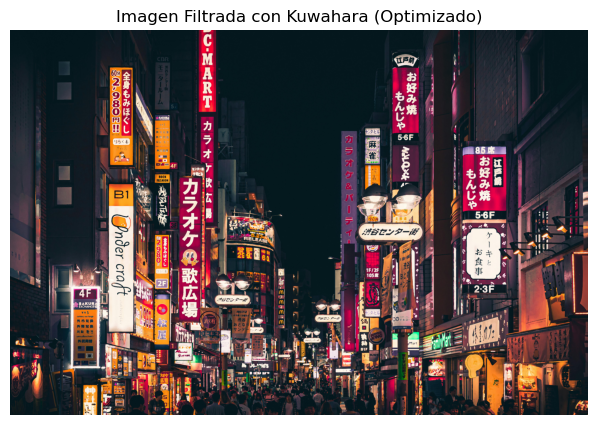

In [36]:
image_path = './img/6/6.jpg'
image = cv2.imread(image_path)

resized_image = cv2.resize(image, (int(image.shape[1]), int(image.shape[0])))

filtered_image_optimized = kuwahara_filter(resized_image, window_size=5)

plt.figure(figsize=(10, 5))
plt.imshow(cv2.cvtColor(filtered_image_optimized, cv2.COLOR_BGR2RGB))
plt.title("Imagen Filtrada con Kuwahara (Optimizado)")
plt.axis('off')
plt.show()

# **7. Obtener bordes**

Tenemos una imagen de un bowl con unos limones y queremos obtener los bordes de los limones. Para ello, hemos aplicado un filtro de Canny. Hemos tenido que ajustar los parámetros para obtener un resultado satisfactorio. Hemos probado con varios valores y hemos obtenido un resultado satisfactorio con un umbral inferior de 120 y un umbral superior de 170.

In [37]:
def detect_edges(image, low_threshold=50, high_threshold=150):
    """
    Aplica el algoritmo de detección de bordes de Canny a una imagen.
    - image: Imagen en escala de grises.
    - low_threshold: Umbral bajo para la detección de bordes.
    - high_threshold: Umbral alto para la detección de bordes.
    -> return: Imagen con los bordes detectados.
    """
    edges = cv2.Canny(image, low_threshold, high_threshold)
    return edges

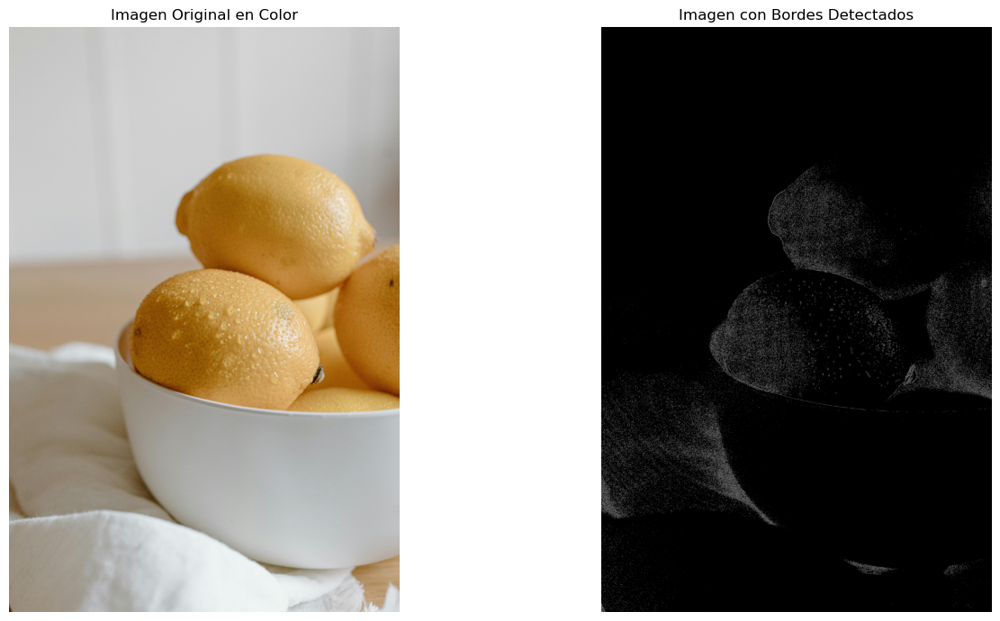

In [56]:
image_borders_color = cv2.imread('./img/7/7.jpg')  # Imagen en color
image_borders_gray = cv2.cvtColor(image_borders_color, cv2.IMREAD_GRAYSCALE)

# Aplicar la detección de bordes
edges_detected = detect_edges(image_borders_gray, low_threshold=120, high_threshold=170)

fig, ax = plt.subplots(1, 2, figsize=(15, 7))

ax[0].imshow(cv2.cvtColor(image_borders_color, cv2.COLOR_BGR2RGB))
ax[0].set_title('Imagen Original en Color')
ax[0].axis('off')

ax[1].imshow(edges_detected, cmap='gray')
ax[1].set_title('Imagen con Bordes Detectados')
ax[1].axis('off')

plt.tight_layout()
plt.show()

# **8. Detectar objetos de la imagen**

En este caso tenemos una imagen de una costa con varias conchas. Hemos optado por umbralizar la imagen y detectar los contornos. Hemos tenido que ajustar los parámetros para obtener un resultado satisfactorio. Hemos probado con varios valores y hemos obtenido un resultado satisfactorio con un umbral de 150.

In [59]:
def detect_objects(image, threshold_value=127):
    """
    Detecta los objetos en una imagen utilizando umbralización y contornos.
    - image: Imagen en formato de matriz numpy (RGB).
    - threshold_value: Valor de umbral para la binarización.
    -> return: Imagen con los objetos detectados delineados.
    """
    # Convertir la imagen a escala de grises
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Aplicar umbralización binaria
    _, binary_image = cv2.threshold(gray_image, threshold_value, 255, cv2.THRESH_BINARY_INV)

    # Detectar contornos
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Dibujar los contornos en la imagen original
    detected_image = image.copy()
    cv2.drawContours(detected_image, contours, -1, (0, 255, 0), 2)

    return detected_image, binary_image


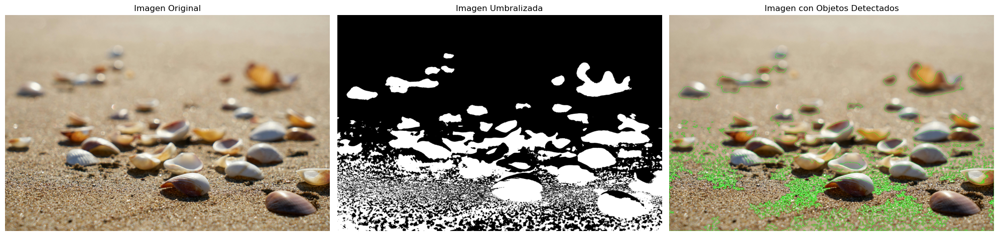

In [68]:
image_objects = cv2.imread('./img/8/8.jpg')

detected_image, binary_image = detect_objects(image_objects, threshold_value=150)

fig, ax = plt.subplots(1, 3, figsize=(20, 10))

ax[0].imshow(cv2.cvtColor(image_objects, cv2.COLOR_BGR2RGB))
ax[0].set_title('Imagen Original')
ax[0].axis('off')

ax[1].imshow(binary_image, cmap='gray')
ax[1].set_title('Imagen Umbralizada')
ax[1].axis('off')

ax[2].imshow(cv2.cvtColor(detected_image, cv2.COLOR_BGR2RGB))
ax[2].set_title('Imagen con Objetos Detectados')
ax[2].axis('off')

plt.tight_layout()
plt.show()

En el entorno de ejecución de Google Colab, hemos obtenido un mejor resultado con exactamente el mismo parámetro.

![imagen](img/8/8output.png)

# **10. Comparación entre imágenes**

Para realizar una comparación entre imágenes, hemos optado por diferentes métodos. Principalmente hemos comparado los histogramas de las imágenes y hemos calculado el ssim entre las imágenes.

In [83]:
def resize_to_match(image1, image2):
    """
    Redimensiona image2 para que coincida con las dimensiones de image1.
    """
    return cv2.resize(image2, (image1.shape[1], image1.shape[0]))

def compare_histograms(image1, image2):
    """
    Compara los histogramas de dos imágenes y los muestra.
    """
    channels = ['b', 'g', 'r']
    plt.figure(figsize=(15, 5))
    for i, channel in enumerate(channels):
        hist1 = cv2.calcHist([image1], [i], None, [256], [0, 256])
        hist2 = cv2.calcHist([image2], [i], None, [256], [0, 256])
        plt.subplot(1, 3, i + 1)
        plt.plot(hist1, color=channel, label=f'Imagen 9 - {channel.upper()}')
        plt.plot(hist2, color=channel, linestyle='dashed', label=f'Imagen 10 - {channel.upper()}')
        plt.title(f'Comparación de Histogramas - Canal {channel.upper()}')
        plt.legend()
    plt.tight_layout()
    plt.show()

def compare_ssim(image1, image2):
    """
    Calcula y muestra el índice SSIM entre dos imágenes.
    """
    gray1 = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(image2, cv2.COLOR_BGR2GRAY)
    score, diff = ssim(gray1, gray2, full=True)
    diff = (diff * 255).astype("uint8")
    return score, diff

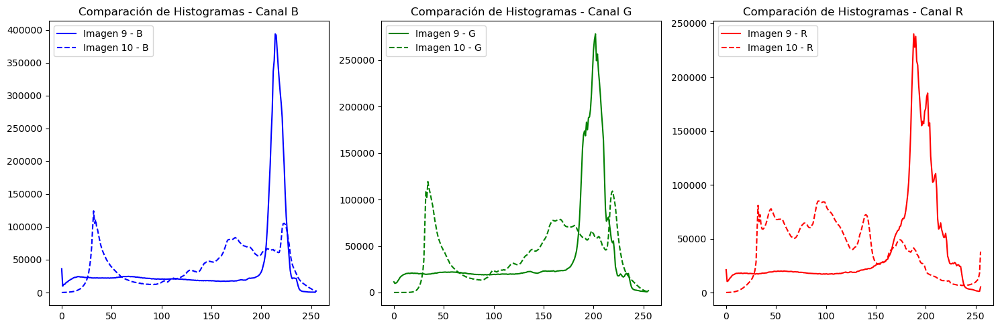

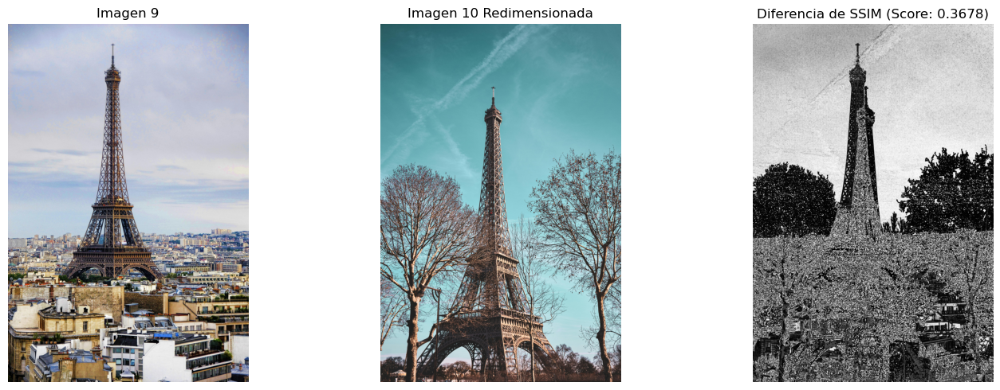

In [84]:
image_9 = cv2.imread('./img/9/9.jpg')
image_10 = cv2.imread('./img/9/10.jpg')

# Redimensionar la segunda imagen para que coincida con las dimensiones de la primera
image_10_resized = resize_to_match(image_9, image_10)

compare_histograms(image_9, image_10_resized)

ssim_score, ssim_diff = compare_ssim(image_9, image_10_resized)

plt.figure(figsize=(15, 5))
plt.subplot(1, 3, 1)
plt.imshow(cv2.cvtColor(image_9, cv2.COLOR_BGR2RGB))
plt.title('Imagen 9')
plt.axis('off')

plt.subplot(1, 3, 2)
plt.imshow(cv2.cvtColor(image_10_resized, cv2.COLOR_BGR2RGB))
plt.title('Imagen 10 Redimensionada')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.imshow(ssim_diff, cmap='gray')
plt.title(f'Diferencia de SSIM (Score: {ssim_score:.4f})')
plt.axis('off')

plt.tight_layout()
plt.show()

Canal B (Azul): La imagen 9 tiene un pico muy alto alrededor del valor 200, lo cual indica una predominancia de tonos azules claros, mientras que la imagen 10 tiene un pico más bajo en el mismo rango, sugiriendo una menor intensidad de tonos claros.

Canal G (Verde): La imagen 10 parece tener una presencia mayor de tonos verdes en la zona de intensidad baja (cerca de 50), mientras que la imagen 9 tiene una distribución más concentrada en la zona alta.

Canal R (Rojo): Muy similar a los otros dos canales.

Respecto del SSIM, su baja puntuación sugiere diferencias notables entre las imágenes en términos de detalles estructurales, posiblemente debido a la diferencia de perspectiva, etc.

In [86]:
def calculate_color_statistics(image):
    """
    Calcula la media y desviación estándar de los canales RGB de una imagen.
    - image: Imagen en formato de matriz numpy (RGB).
    -> return: Diccionario con la media y desviación estándar de cada canal.
    """
    stats = {}
    for i, color in enumerate(['B', 'G', 'R']):
        mean_val = np.mean(image[:, :, i])
        std_val = np.std(image[:, :, i])
        stats[color] = {'mean': mean_val, 'std': std_val}
    return stats

def compare_color_histograms(image1, image2):
    """
    Compara los histogramas de color de dos imágenes y calcula la similitud usando correlación.
    - image1: Primera imagen en formato de matriz numpy (RGB).
    - image2: Segunda imagen en formato de matriz numpy (RGB).
    -> return: Diccionario con la similitud de histograma para cada canal de color.
    """
    similarities = {}
    for i, color in enumerate(['B', 'G', 'R']):
        hist1 = cv2.calcHist([image1], [i], None, [256], [0, 256])
        hist2 = cv2.calcHist([image2], [i], None, [256], [0, 256])
        hist1 = cv2.normalize(hist1, hist1).flatten()
        hist2 = cv2.normalize(hist2, hist2).flatten()
        correlation = cv2.compareHist(hist1, hist2, cv2.HISTCMP_CORREL)
        similarities[color] = correlation
    return similarities


In [88]:
color_stats_9 = calculate_color_statistics(image_9)
color_stats_10 = calculate_color_statistics(image_10)

hist_similarity = compare_color_histograms(image_9, image_10)

# Mostrar las estadísticas de color
print("Estadísticas de Color para la Imagen 9:")
for color, stats in color_stats_9.items():
    print(f"{color} - Media: {stats['mean']:.2f}, Desv Estandar: {stats['std']:.2f}")

print("\nEstadísticas de Color para la Imagen 10:")
for color, stats in color_stats_10.items():
    print(f"{color} - Media: {stats['mean']:.2f}, Desv Estandar: {stats['std']:.2f}")

print("\nSimilitud de Histograma de Color:")
for color, similarity in hist_similarity.items():
    print(f"{color} Canal: {similarity:.4f}")

Estadísticas de Color para la Imagen 9:
B - Media: 166.71, Desv Estandar: 69.65
G - Media: 161.68, Desv Estandar: 62.10
R - Media: 161.74, Desv Estandar: 59.14

Estadísticas de Color para la Imagen 10:
B - Media: 146.43, Desv Estandar: 68.52
G - Media: 142.63, Desv Estandar: 65.60
R - Media: 110.91, Desv Estandar: 56.30

Similitud de Histograma de Color:
B Canal: 0.3512
G Canal: 0.3161
R Canal: -0.1466
